### Big Data Science
# Analysis of Vizgen MERFISH dataset of mouse liver cells

## Running this Notebook
Below you can find instructions for installing and running this notebook from the head node of the Dask cluster.
### Setup
When running this notebook on the cluster head node for the first time you need to create a new Python 3.9.xx environment using `conda`

```
$ conda create -n bigdatascience python=3.9
```

Then activate the environment on the cluster:
```
$ conda activate
```

Next install the requirements on the cluster for this notebook using pip:

```
$ pip install -r requirements.
```

Next enable the python widgets to be able to display progress bars.

```
$ jupyter nbextension enable --py widgetsnbextension
```

Afterwards start a Jupyter Notebook on the head node:

```
$ jupyter notebook --no-browser --port=8890
```

To access Jupyter locally, you'll need an SSH tunnel. From another terminal on your **local** machine run:
```
$ ssh -N -L localhost:8888:localhost:8890 <username>@193.190.80.16 -p 50022
```

You can now access Jupyter on your local machine via [localhost:8888](http://localhost:8888)

In [1]:
import dask
from dask.distributed import Client, progress
import dask.dataframe as dd
import dask.bag as db
import dask.array as da
import json
import numpy as np
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning) # Internal deprecation warnings of packages should be ignored
IS_REMOTE = False

In [2]:
if IS_REMOTE:
    client = Client('bds-head:8786')
else:
    client = Client(n_workers=8)

/home/ndossche/.conda/envs/scip/lib/python3.8/site-packages/distributed/node.py:181: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44789 instead
  warnings.warn(
distributed.diskutils - INFO - Found stale lock file and directory '/home/ndossche/BdsProject/tunneling/dask-worker-space/worker-ta80bql5', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home/ndossche/BdsProject/tunneling/dask-worker-space/worker-smmbipgp', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home/ndossche/BdsProject/tunneling/dask-worker-space/worker-z9qif8ik', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home/ndossche/BdsProject/tunneling/dask-worker-space/worker-57l1t2is', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home/ndossche/BdsProject/tunneling/dask-worker-space/worker-hq3fnm_5', purging
distributed.diskutils - IN

In [3]:
client.dashboard_link

'http://127.0.0.1:44789/status'

In [4]:
CFG_IMAGE_OFFSET = (45_000, 45_000) # Fixed for all input datasets
CFG_HDFS_HOST = 'hdfs://bds-head:9000'
CFG_FILE_PREFIX = CFG_HDFS_HOST + '/data/'
CFG_ZARR_IMAGE = CFG_FILE_PREFIX + '1_000.zarr' # '1_000.zarr'
CFG_ZARR_IMAGE_LARGE = CFG_FILE_PREFIX + '45_000.zarr' 
CFG_LIVER_PREFIX = '/data/vz-liver-showcase/Liver1Slice1/'
CFG_LIVER_IMAGES_MANIFEST = CFG_HDFS_HOST + CFG_LIVER_PREFIX + 'detected_transcripts.csv' # Contains information about coordinates
CFG_LIVER_TRANSCRIPT_CSV = CFG_HDFS_HOST + CFG_LIVER_PREFIX + 'detected_transcripts.csv' # Contains information about coordinates
CFG_CELL_BOUNDARIES = CFG_LIVER_PREFIX + 'cell_boundaries'

In [5]:
# We will read the manifest file about the images such that no hardcoding of constants is used,
# and thus our code generalises to other data of the same kind.
#b = db.read_text(CFG_LIVER_IMAGES_MANIFEST).map(json.loads)
#b.compute()

# TODO: note: deze file ontbreekt op de hdfs, dus de claim van in de transformation example notebook dat je de metadata in die file moet bekijken klopt dus niet
#       Therefore, for now, manueel heb ik hier de values vd json gekopieerd, als de json (ooit) beschikbaar komt, dan kunnen die gwn hier verbatim in vervangen worden :)
COORDS_MICRONS_PER_PIXEL = 0.108
IMAGE_BBOX_OFFSET = (-41.61239999999996, -107.97948000000231)

def micron_to_pixels(df, xy_columns=[('x', 'y')], reversed=True):
    coord_remapper_x, coord_remapper_y = (1, 0) if reversed else (0, 1)
    
    for x, y in xy_columns:
        df[x] -= IMAGE_BBOX_OFFSET[coord_remapper_x]
        df[y] -= IMAGE_BBOX_OFFSET[coord_remapper_y]
        df[x] /= COORDS_MICRONS_PER_PIXEL
        df[y] /= COORDS_MICRONS_PER_PIXEL
        df[x] -= CFG_IMAGE_OFFSET[coord_remapper_x]
        df[y] -= CFG_IMAGE_OFFSET[coord_remapper_y]
    df = df.astype({
        col:'int64' for cols in xy_columns for col in cols
    })
    return df

def micron_list_to_pixels(microns):
    xs = []
    ys = []
    for micron in microns:
        x = micron[0]
        y = micron[1]
        x -= IMAGE_BBOX_OFFSET[0]
        y -= IMAGE_BBOX_OFFSET[1]
        x /= COORDS_MICRONS_PER_PIXEL
        y /= COORDS_MICRONS_PER_PIXEL
        x -= CFG_IMAGE_OFFSET[0]
        y -= CFG_IMAGE_OFFSET[1]
        xs.append(x)
        ys.append(y)

    return xs, ys

# Instead of transforming the dataframe, do a more performant approach (?) by simply transforming our own coordinates
def pixels_to_micron(x, y):
    x += CFG_IMAGE_OFFSET[0]
    y += CFG_IMAGE_OFFSET[1]
    x *= COORDS_MICRONS_PER_PIXEL
    y *= COORDS_MICRONS_PER_PIXEL
    x += IMAGE_BBOX_OFFSET[0]
    y += IMAGE_BBOX_OFFSET[1]
    return x, y

def pixels_to_microns(xs, ys, offset=45_000):
    output = []
    for x, y in zip(xs, ys):
        if offset:
            x += offset
            y += offset
        x *= COORDS_MICRONS_PER_PIXEL
        y *= COORDS_MICRONS_PER_PIXEL
        x += IMAGE_BBOX_OFFSET[0]
        y += IMAGE_BBOX_OFFSET[1]
        output.append([x, y])
    return output

In [6]:
# RE: binary format
# Dask dataframes are already stored in-memory in a binary form.
# To reduce memory usage I discard some columns during the reading of the file with "usecols".
# We also can't seem to easily control the chunking on HDFS with a custom partitioning method.
# Luckily, there's a "query" method that seems to stream-scan the data.
# We can create a single query for each image tile inside a chunk, which seems like the most promising solution (?)

# Optimisation to store as binary
detected_transcripts_dtype = {
    'global_x': 'float32',
    'global_y': 'float32',
    'gene': 'string',
    'transcript_id': 'string'
}

detected_transcripts = dd.read_csv(CFG_LIVER_TRANSCRIPT_CSV, usecols=['global_x', 'global_y', 'gene', 'transcript_id'], dtype=detected_transcripts_dtype)
detected_transcripts.head()

2022-05-11 22:46:53,586 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:55,286 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


,global_x,global_y,gene,transcript_id
0,2506.406982,-95.451477,Comt,ENSMUST00000000335
1,2531.844727,-95.187019,Comt,ENSMUST00000000335
2,2483.796875,-91.360115,Comt,ENSMUST00000000335
3,2505.769287,-84.081650,Comt,ENSMUST00000000335
4,2501.394043,-81.387093,Comt,ENSMUST00000000335


In [7]:
genes = detected_transcripts['gene'].unique().compute()
genes = {genes[i]:i for i in range(len(genes))}

2022-05-11 22:46:57,863 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:57,904 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:57,986 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:58,011 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:58,019 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:58,031 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-11 22:46:58,053 WARN util.NativeCodeLoader: Unable to load native-ha

In [8]:
def create_xy_filter(xy_columns, start=0, end=1_000):
    return ' | '.join([
        f'{start} < {x} < {end} & {start} < {y} < {end}' for (x, y) in xy_columns
    ])

In [9]:
def zstack_normalization(arr, operation, dtype=np.float64):
    if operation == 'mean':
        return da.mean(arr, axis=0, dtype=dtype)
    if operation == 'median':
        return da.median(arr, axis=0).astype(dtype)
    if operation == 'min':
        return da.min(arr, axis=0).astype(dtype)
    if operation == 'max':
        return da.max(arr, axis=0).astype(dtype)
    
    raise ValueError("Operation not found.")

In [10]:
from skimage.morphology import white_tophat, black_tophat, disk
import cv2

def tophat_filter(image, radius):
    # Scikit-image's tophat filter is veeeery slow.
    # While OpenCV2's implemetation is very fast due to a native SIMD implementation.
    #%time str_el = disk(radius)
    #return white_tophat(image, str_el)
    str_el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (radius, radius))
    return cv2.morphologyEx(image, cv2.MORPH_TOPHAT, str_el)

In [11]:
from skimage import filters

# This function uses a single gaussian to denoise
def gaussian_blur_to_reduce_noise(img, dtype=np.float64):
    return filters.gaussian(img, sigma=3, mode='nearest')

# This function will use the difference of gaussians to denoise
def gaussian_diff_to_reduce_noise(img, dtype=np.float64):
    return filters.difference_of_gaussians(img, 3, 300)

In [12]:
from skimage import exposure

def histogram_equalization(img, dtype=np.float64):
    return exposure.equalize_adapthist(img).astype(dtype)

In [13]:
def preprocessing(image, radius=100, dtype=np.float64, denoise_fn=gaussian_blur_to_reduce_noise):
    if np.max(image) < 50:
        # No cells clipping threshold
        return np.zeros(image.shape, dtype=dtype)
    if denoise_fn:
        image = denoise_fn(image)
    return histogram_equalization(tophat_filter(image, radius=radius), dtype=dtype)

In [14]:
from skimage.segmentation import watershed
from skimage.filters import threshold_multiotsu
from skimage.feature import peak_local_max
from skimage.measure import label
from skimage.morphology import closing, opening, square, erosion, dilation
from scipy.ndimage import distance_transform_edt

def threshold_image(image):
    threshold = threshold_multiotsu(image, classes=2)
    cells = image > threshold
    return cells

def segmentation(image):
    # If the image has one value, it is completely black and will crash during thresholding
    # But if it's black, then there's only a background layer: so skip all this processing
    if np.max(image) == 0:
        return np.zeros(image.shape, dtype=np.uint8)
    
    cells = threshold_image(image)
    
    distance = distance_transform_edt(cells)
    
    local_max_coords = peak_local_max(distance, min_distance=7)
    local_max_mask = np.zeros(distance.shape, dtype=bool)
    local_max_mask[tuple(local_max_coords.T)] = True
    markers = label(local_max_mask)
    
    segmented_cells = watershed(-distance, markers, mask=cells)
        
    return segmented_cells

In [15]:
from skimage.measure import regionprops, find_contours, approximate_polygon
from matplotlib.patches import Rectangle

def region_is_big_enough_to_be_a_cell(props):
    MIN_SIZE = 35
    # Use the fact that a cell is always somewhat round or elliptical, not an almost-flat-spaghetti-line
    start_y, start_x, end_y, end_x = props.bbox
    width = end_x - start_x
    height = end_y - start_y
    return props.area >= MIN_SIZE * MIN_SIZE and min(width, height) >= MIN_SIZE

def sort_xy(x, y):
    # https://stackoverflow.com/questions/58377015
    mean_x = np.mean(x)
    mean_y = np.mean(y)
    r = np.sqrt((x - mean_x) ** 2 + (y - mean_y) ** 2)
    angles = np.where((y - mean_y) > 0, np.arccos((x - mean_x) / r), 2 * np.pi - np.arccos((x - mean_x) / r))
    mask = np.argsort(angles)
    x_sorted = x[mask]
    y_sorted = y[mask]
    return x_sorted, y_sorted

def convert_region_to_own_representation(region, simplify_contours):
    # Does not work because the contours are not fully connected components :'(
    #contour = region.coords
    #found_contours = find_contours(region.image_filled, 0.9999)
    #contour = numpy.concatenate(numpy.array(found_contours))
    #contour[:, 0] += region.bbox[0]
    #contour[:, 1] += region.bbox[1]
    
    distance = distance_transform_edt(np.pad(region.image_filled, 1, mode='constant'))
    contour = np.array(np.where(distance == 1))
    
    contour = np.swapaxes(contour, 0, 1)
    contour[:, 0] += region.bbox[0]
    contour[:, 1] += region.bbox[1]
    
    # Needs to be sorted in an orientation, otherwise skimage algorithms and visualisations fail...
    sorted_x, sorted_y = sort_xy(contour[:, 0], contour[:, 1])
    contour = np.dstack([sorted_x, sorted_y])[0]
    
    if simplify_contours:
        contour = approximate_polygon(contour, 3)
    
    return {
        'bbox': region.bbox,
        'contour': contour
    }

def compute_cell_regions(segmented_image, simplify_contours=True):
    # Note: Simplifying the contour can be useful to improve performance and have less rigged edges
    
    # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
    regions = regionprops(segmented_image)
    
    filtered_regions = [
        convert_region_to_own_representation(region, simplify_contours)
        for region in regions
        if region_is_big_enough_to_be_a_cell(region)
    ]
    
    #print(filtered_regions) # DEBUG INFO
    #print(len(filtered_regions), 'regions after filtering') # DEBUG INFO
    return filtered_regions

In [16]:
def convert_point_to_micron_coordinates(tile_offset, xy):
    # Convert coordinates to data frame coordinates:
    #  - Add offset of tile
    #  - Convert from pixels to microns
    tile_offset_x, tile_offset_y = tile_offset
    x, y = xy
    x += tile_offset_x
    y += tile_offset_y
    return pixels_to_micron(x, y)

def convert_rectangle_to_micron_coordinates(tile_offset, rectangle):
    return (
        *convert_point_to_micron_coordinates(tile_offset, (rectangle[0], rectangle[1])),
        *convert_point_to_micron_coordinates(tile_offset, (rectangle[2], rectangle[3]))
    )

def create_filter_single_rectangle(xy_column, min_y, min_x, max_y, max_x):
    """Creates a filter that can be used on a dataframe to filter to data contained within the provided rectangle"""
    return f'({min_x} < {xy_column[0]} < {max_x} & {min_y} < {xy_column[1]} < {max_y})'


def create_filter_multiple_rectangles(xy_column, rectangles):
    """Creates a filter that can be used on a dataframe to filter to data contained within the provided rectangles
    The format of the rectangles is a list of the form [(min_y, min_x, max_y, max_x), ...]
    """
    return ' | '.join([
         create_filter_single_rectangle(xy_column, *rectangle) for rectangle in rectangles
    ])

In [17]:
import math
import time
from scipy.sparse import csr_matrix
from skimage.measure import points_in_poly
from anndata import AnnData


def transcript_in_region(transcript, region):
    x = transcript['global_x']
    y = transcript['global_y']
    
    # Checking if a point is in a polygon is super slow
    # Optimisation: if it is not in the bounding box, it will definitely not be in the polygon
    #               => this is a coarse-grained filtering first
    start_x, start_y, end_x, end_y = region['bbox']
    if start_x <= x <= end_x and start_y <= y <= end_y:
        return points_in_poly([[y, x]], region['contour'])
    return False

def compute_centroid_from_bbox(bbox):
    return [(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2]

def get_gene_expression_matrix(transcripts_for_regions, regions, regions_len, genes):
    # Don't create an empty csr_matrix that is continuously updated for performance reasons
    gene_expression_matrix = [[0] * len(genes) for _ in range(regions_len)]
    
    for transcript in transcripts_for_regions.to_dict('records'):
        for i, region in enumerate(regions):
            if transcript_in_region(transcript, region):
                g = genes[transcript['gene']]
                gene_expression_matrix[i][g] += 1
                break
    
    coordinates = np.array([region['micron_centroid'] for region in regions])
    
    if len(coordinates) == 0:
        return None
    
    matrix = csr_matrix(gene_expression_matrix)
    adata = AnnData(matrix, obsm={'spatial': coordinates}, dtype=matrix.dtype)        
    adata.obs_names = [f'Cell_{i:d}' for i in range(adata.n_obs)]
    adata.var_names = genes.keys()
                    
    return adata     

def convert_region_coordinates(tile_offset, region):
    start_y, start_x, end_y, end_x = region['bbox']
    #print(region['bbox'], region['contour'])
    tile_offset_x, tile_offset_y = tile_offset
    return {
        'bbox': (start_x + tile_offset_x, start_y + tile_offset_y, end_x + tile_offset_x, end_y + tile_offset_y),
        'micron_centroid': compute_centroid_from_bbox(convert_rectangle_to_micron_coordinates(tile_offset, (start_x, start_y, end_x, end_y))),
        'contour': region['contour'] + np.array([tile_offset_y, tile_offset_x])
    }

def gene_allocation(segmented_image, block_info=None):
    # "If func accepts block_info= or block_id= as keyword arguments, it is passed as a dict"
    array_location = block_info[0]['array-location']
    tile_offset = (array_location[0][0], array_location[1][0])
    chunk_shape = block_info[None]['chunk-shape']
    
    filtered_regions = compute_cell_regions(segmented_image)
    # We cannot transform the transcript coordinates, because that file is huge and does not fit in main memory well
    # So, we tranform the regions coordinates to the coordinate space of the transcript file
    filtered_regions = list(map(lambda item: convert_region_coordinates(tile_offset, item), filtered_regions))
    
    # Build a single rough query to filter the transcripts csv
    converted_coordinates_for_tile = convert_rectangle_to_micron_coordinates(tile_offset, (0, 0, *chunk_shape))
    transcripts_query_filter = create_filter_single_rectangle(['global_y', 'global_x'], *converted_coordinates_for_tile)
    
    # Query transcripts
    # This step computes the filter on the transcripts, note that this takes a while, but shouldn't matter if executed on workers
    # Now 'transcripts_for_these_regions' will contain all transcript entries that overlap with one of our rectangles in this tile chunk
    transcripts_for_these_regions = detected_transcripts.query(transcripts_query_filter).compute()
    transcripts_for_these_regions = micron_to_pixels(transcripts_for_these_regions, xy_columns=[('global_y', 'global_x')])
    
    gem = get_gene_expression_matrix(transcripts_for_these_regions, filtered_regions, len(filtered_regions), genes)
        
    return gem

In [18]:
def write_hdfs(adata, block_info=None):    
    tile_offset = block_info[0]['chunk-location']
    
    if adata is not None:
        adata.write(f"tiles/tile_{tile_offset[0]}_{tile_offset[1]}.h5ad")
    
    return 0

In [19]:
def pipeline(
    filename,
    projection_operation='max',
    chunks=(7, 1000, 1000)
):
    # Store a .zarr file in a dask array
    #zarr_array = da.from_zarr(filename, chunks=chunks)
    zarr_array = da.from_zarr(filename, chunks=chunks)[:, :25000, :25000]
    #zarr_array = da.from_zarr(filename, chunks=chunks)[:, :5000, :5000]
    #zarr_array = da.from_zarr(filename, chunks=chunks)[:, :chunks[1], :chunks[2]] # For testing on a small slice

    # Z-stack projection for all blocks
    normalized = zstack_normalization(zarr_array, projection_operation, dtype=np.uint16)
    
    # Chunks after z-stack projection
    projected_chunks = (chunks[1], chunks[2])
    
    # Image preprocessing
    preprocessed = normalized.map_blocks(preprocessing, denoise_fn=gaussian_diff_to_reduce_noise, chunks=projected_chunks)
    
    # Segmentation
    block_normalized_meta = np.array((), dtype=np.float64)
    segmented = preprocessed.map_blocks(segmentation, meta=block_normalized_meta, chunks=projected_chunks)
    
    # Gene allocation
    allocated = segmented.map_blocks(gene_allocation, meta=block_normalized_meta, chunks=projected_chunks)
    
    # Write to disk
    written = allocated.map_blocks(write_hdfs, dtype=int)
    
    # Little hack to reduce the dimensions to 0
    reduction = lambda x, axis, keepdims: 0
    return da.reduction(written, reduction, reduction, dtype=int, concatenate=False)

In [20]:
future = pipeline(CFG_ZARR_IMAGE_LARGE, chunks=(7, 2500, 2500))
result = client.compute(future)
progress(result)

VBox()

In [ ]:
def visualize_dask_graph(pipeline, high_level=True):
    if high_level:
        return pipeline.dask
    else:
        return pipeline.visualize()

In [ ]:
visualize_dask_graph(pipeline(CFG_ZARR_IMAGE, projection_operation='max', chunks=(7, 500, 500)), True)

### Leiden on merged anndata

The Dask pipeline gives us multiple anndata files: one per image tile. We can merge them together into one anndata file and run scanpy's Leiden algorithm on the merged anndata.

In [10]:
import scanpy as sc

def full_leiden_cluster(adata, nn=15, resolutions=[0.4, 0.6, 1.0, 1.4], us=2000, ss=7):
    sc.pp.neighbors(adata, n_neighbors=nn, use_rep='X')
    keys = []
    
    for res in resolutions:
        key = "leiden_" + str(res)
        sc.tl.leiden(adata, resolution = res, key_added = key)
        keys.append(key)
    
    sc.set_figure_params(figsize=(10, 10))
    
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=keys, size=us)
    
    sc.pl.spatial(adata, color=keys, spot_size=ss)

In [11]:
def reduce_dimensions(adata, min_gene=10, min_cell=2):
    sc.pp.filter_genes(adata, min_counts=min_gene)
    sc.pp.filter_cells(adata, min_counts=min_cell)

In [12]:
from glob import glob

adata_filenames = glob('./tiles/tile_*.h5ad')

In [13]:
import anndata as ad

adatas = [ad.read_h5ad(filename) for filename in adata_filenames[:]]

full_adata = ad.concat(adatas)

full_adata.write('full_output_without_normalisation_and_dimension_reduction.h5ad')

# Reduce dimensions of full data
print('before dimension reduction', full_adata.X.shape)
reduce_dimensions(full_adata)
print('after dimension reduction', full_adata.X.shape)

# Normalise
sc.pp.normalize_total(full_adata, inplace=True)

full_adata.write('full_output_with_normalisation_and_dimension_reduction.h5ad')

full_adata

/home/gfeys/.conda/envs/scip/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


before dimension reduction (50139, 385)
after dimension reduction (44459, 385)


/home/gfeys/.conda/envs/scip/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/gfeys/.conda/envs/scip/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 44459 × 385
    obs: 'n_counts'
    var: 'n_counts'
    obsm: 'spatial'

In [14]:
print('Amount of cells:', full_adata.n_obs)

Amount of cells: 44459


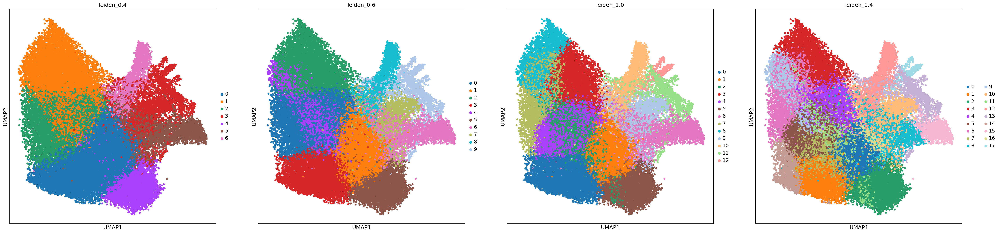

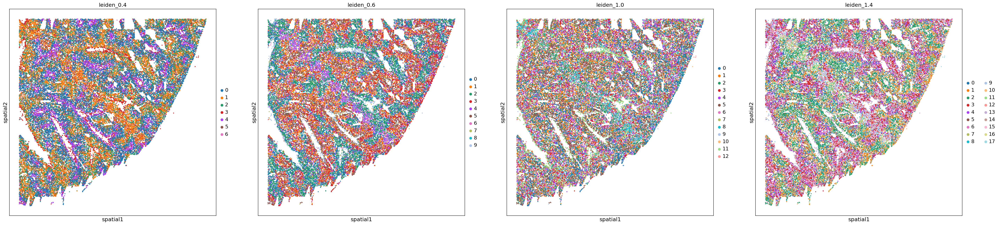

In [15]:
full_leiden_cluster(full_adata, ss=25, us=100)

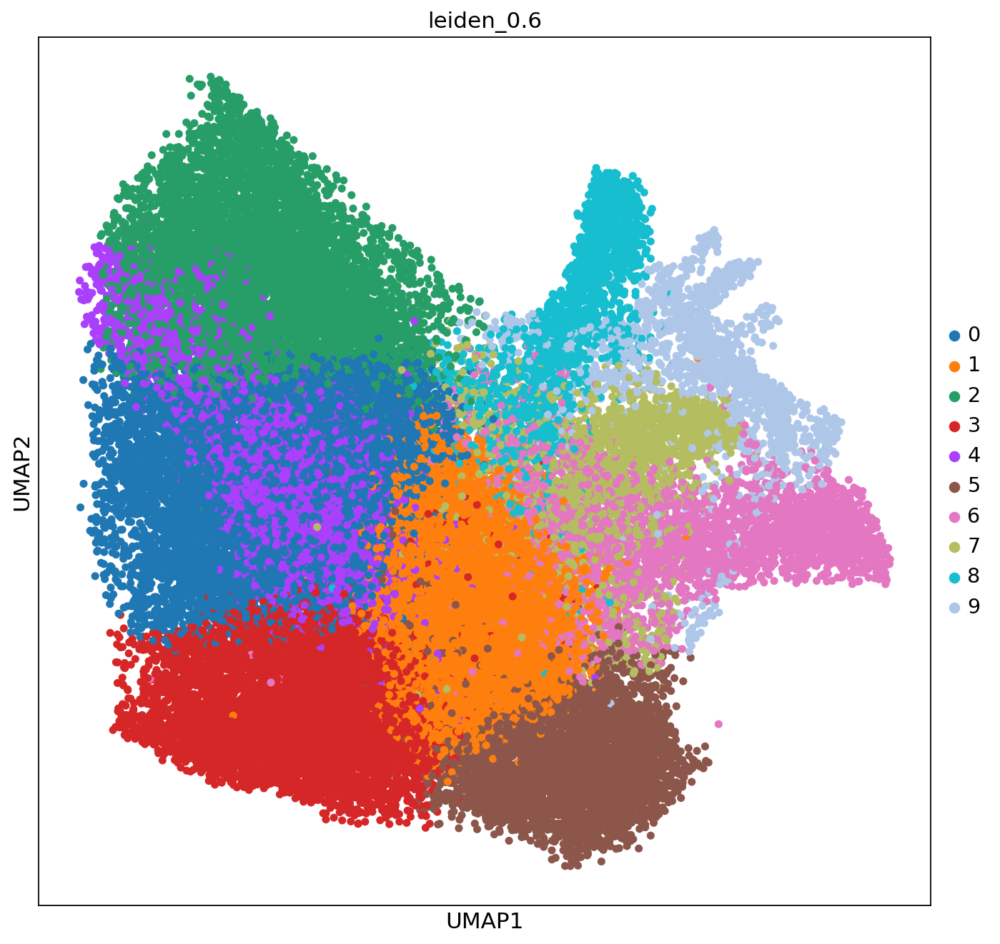

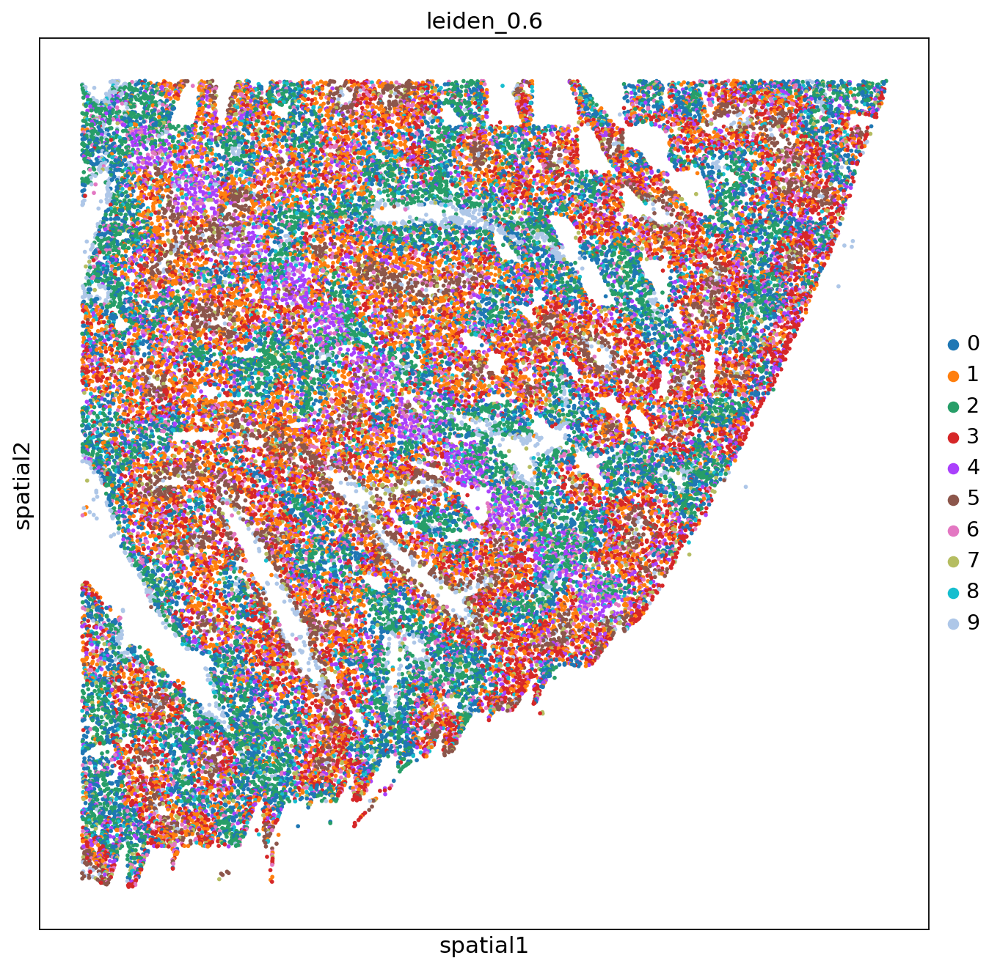

In [16]:
full_leiden_cluster(full_adata, 15, [0.6], ss=25, us=100)